<a href="https://colab.research.google.com/github/olaw01/OpenCV_image_processing/blob/main/01_basics/colab/02_intro_opencv.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### **Praca z obrazami**

Notebook ma na celu przybliżenie podstawowych operacji wykonywanych na obrazie przy użyciu biblioteki OpenCV

Wykorzystamy najpopularniejszą bibliotekę do pracy przy projektach Computer Vision: [OpenCV](https://opencv.org/)


#### **Spis treści:**

1. [Instalacja i import bibliotek](#a1)
2. [Zmiana rozmiaru zdjęcia](#a2)
3. [Rotacja](#a3)
4. [Progowanie](#a4)
5. [Operacja splotu, wygładzanie](#a5)
6. [Generowanie losowego obrazu](#a6)
7. [Detekcja krawędzi](#a7)
8. [Erozja](#a8)

#### **Uwagi:**
>Kurs został stworzony przy pomocy biblioteki w wersji 4.1.2.  
>Aby zaktualizować bibliotekę OpenCV do aktualniej wersji należy użyć polecenia:
```
!pip install --upgrade opencv-python
```
Bądź zainstalować wybierając konkretną wersję, np.
```
!pip install opencv-python==4.1.2.30
```

### <a name='a1'></a> Instalacja i import bibliotek

In [1]:
# !pip install -q --upgrade opencv-python

In [2]:
from google.colab.patches import cv2_imshow
import imutils #przetwarzanie obrazow
import numpy as np
import cv2

cv2.__version__

'4.13.0'

### <a name='a2'></a> Zmiana rozmiaru zdjęcia

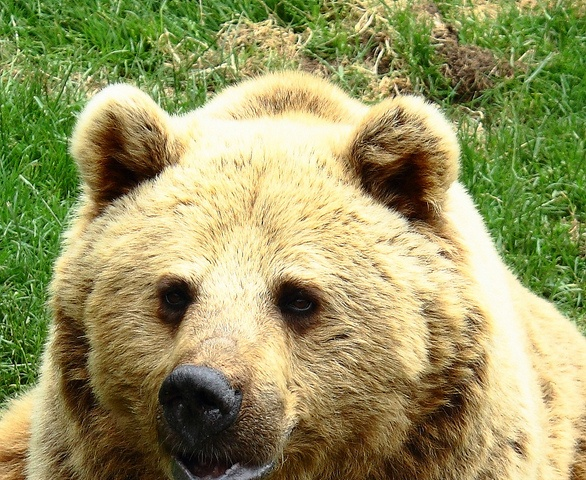

In [4]:
img = cv2.imread('bear.jpg')
cv2_imshow(img)

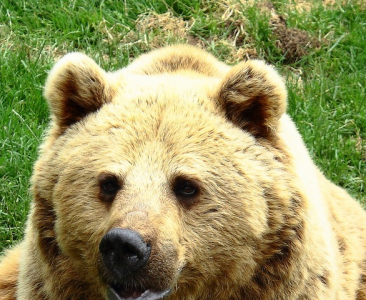

In [5]:
img_resized = imutils.resize(image=img, height=300)
cv2_imshow(img_resized)

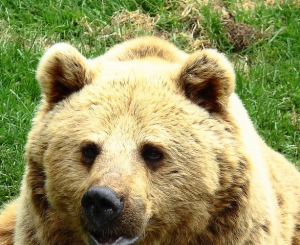

In [6]:
img_resized = imutils.resize(image=img, width=300)
cv2_imshow(img_resized)

### <a name='a3'></a> Rotacja

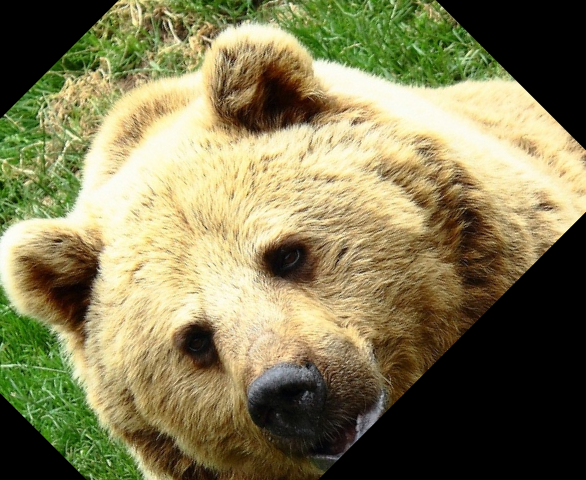

In [7]:
height, width = img.shape[:2]

M = cv2.getRotationMatrix2D(center=(height // 2, width // 2), angle=45, scale=1)
cv2_imshow(cv2.warpAffine(src=img, M=M, dsize=(width, height)))

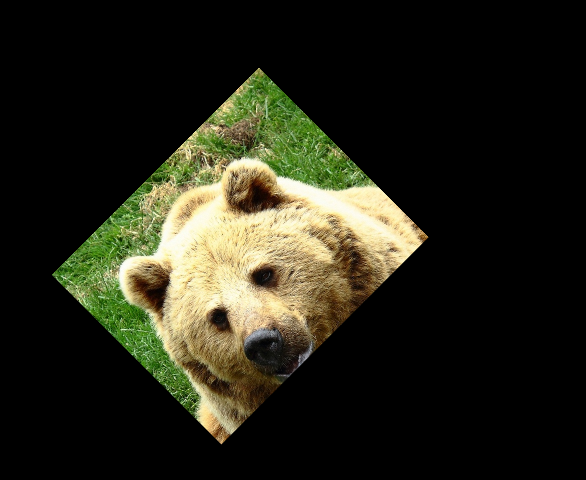

In [8]:
M = cv2.getRotationMatrix2D(center=(height // 2, width // 2), angle=45, scale=0.5)
cv2_imshow(cv2.warpAffine(src=img, M=M, dsize=(width, height)))

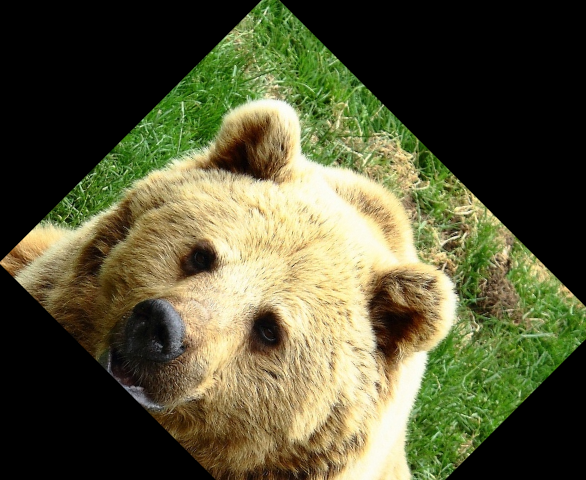

In [9]:
M = cv2.getRotationMatrix2D(center=(height // 2, width // 2), angle=-45, scale=0.8)
cv2_imshow(cv2.warpAffine(src=img, M=M, dsize=(width, height)))

### <a name='a4'></a> Progowanie

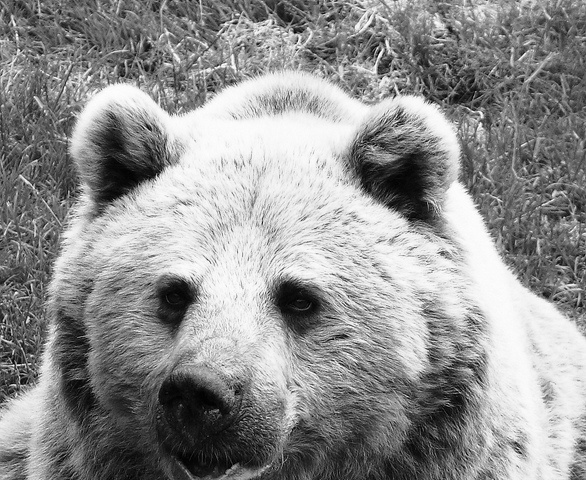

In [10]:
gray = cv2.cvtColor(src=img, code=cv2.COLOR_BGR2GRAY)
cv2_imshow(gray)

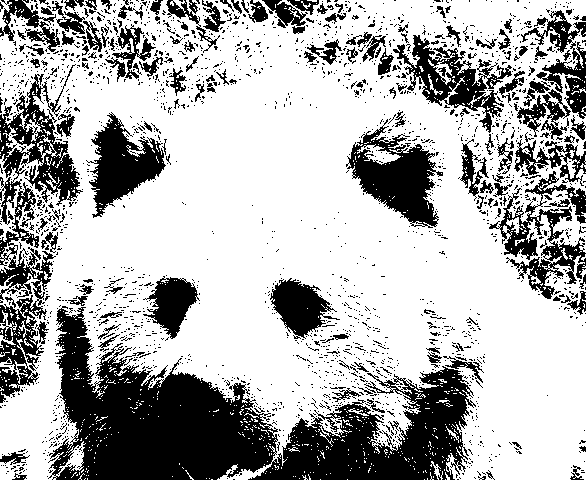

In [12]:
cv2_imshow(cv2.threshold(src=gray, thresh=100, maxval=255, type=cv2.THRESH_BINARY)[1])

### <a name='a5'></a> Operacja splotu, wygładzanie

Matematyczna operacja na macierzach, która dokonuje splotu macierzy reprezentującej obraz z inną mniejszą zwaną jądrem splotu (filtrem).

Przykładowy obraz:

|    |    |    |    |   |
|----|----|----|----|---|
| 12 | 10 | 8  | 5  | 6 |
| 3  | 1  | 4  | 4  | 5 |
| 6  | 6  | 5  | 4  | 4 |
| 12 | 10 | 11 | 11 | 9 |
| 9  | 8  | 7  | 8  | 4 |

Jądro 3x3:

|   |   |   |
|---|---|---|
| 0 | 0 | 0 |
| 0 | 1 | 0 |
| 0 | 0 | 0 |

Jądro 5x5:

|   |   |   |   |   |
|---|---|---|---|---|
| 1 | 1 | 1 | 1 | 1 |
| 1 | 1 | 1 | 1 | 1 |
| 1 | 1 | 1 | 1 | 1 |
| 1 | 1 | 1 | 1 | 1 |
| 1 | 1 | 1 | 1 | 1 |

Poprzez zwiększenie rozmiaru jądra uśreniamy wartość piksela na większym obszarze przez co w przypadku rozmawywania dostajemy mocniejszy efekt.

In [13]:
kernel = np.ones(shape=(5, 5), dtype=np.float32) / 25
kernel

array([[0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04]], dtype=float32)

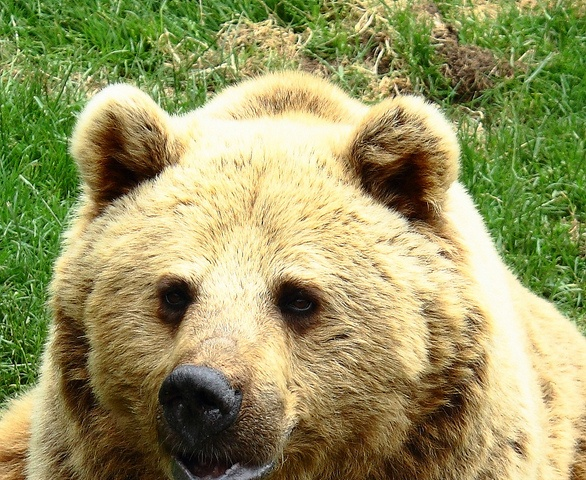

In [14]:
cv2_imshow(img)

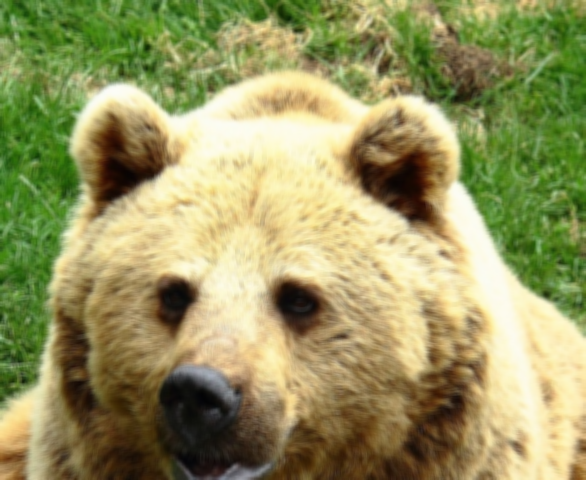

In [15]:
cv2_imshow(cv2.filter2D(src=img, ddepth=-1, kernel=kernel))

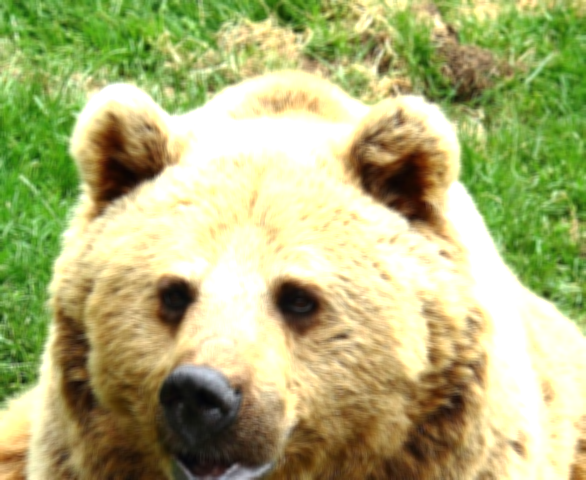

In [18]:
kernel = np.ones((5, 5), np.float32) / 20
cv2_imshow(cv2.filter2D(src=img, ddepth=-1, kernel=kernel))

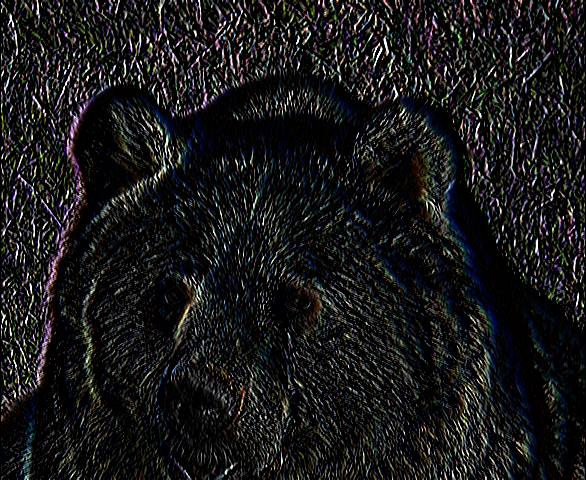

In [19]:
kernel = np.array([[-1, 0, 1],
                   [-1, 0, 1],
                   [-1, 0, 1]])
cv2_imshow(cv2.filter2D(src=img, ddepth=-1, kernel=kernel))

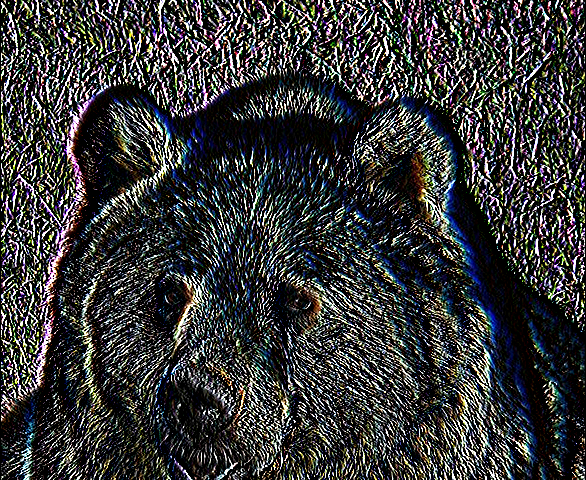

In [21]:
kernel = np.array([[-1, 0, 1],
                   [-5, 0, 5],
                   [-1, 0, 1]])
cv2_imshow(cv2.filter2D(src=img, ddepth=-1, kernel=kernel))

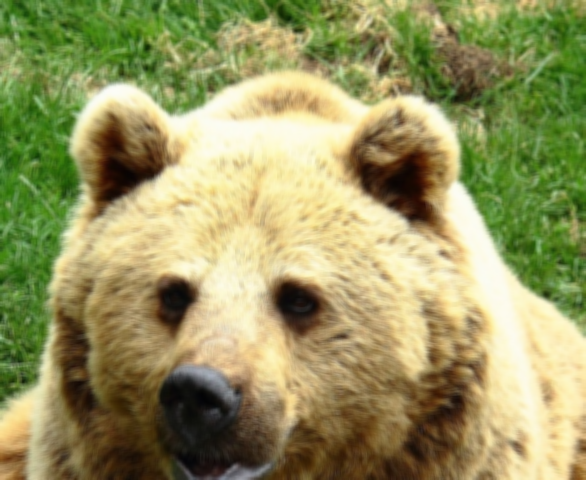

In [22]:
cv2_imshow(cv2.blur(src=img, ksize=(5, 5)))

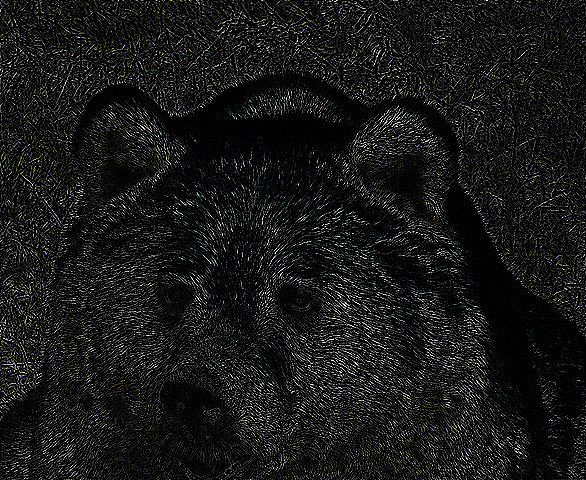

In [23]:
cv2_imshow(cv2.Laplacian(src=img, ddepth=cv2.CV_64F))

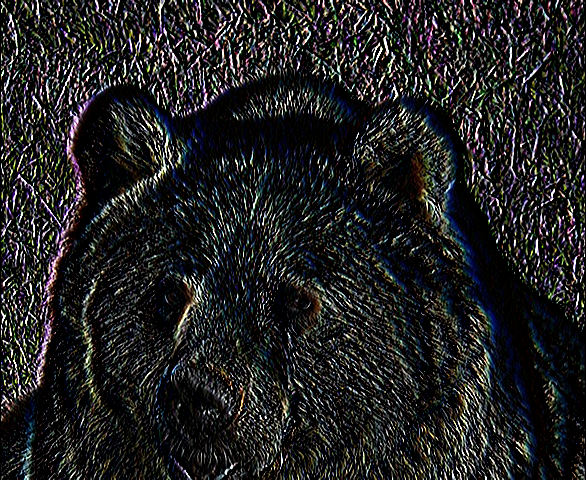

In [24]:
cv2_imshow(cv2.Sobel(src=img, ddepth=cv2.CV_64F, dx=1, dy=0))

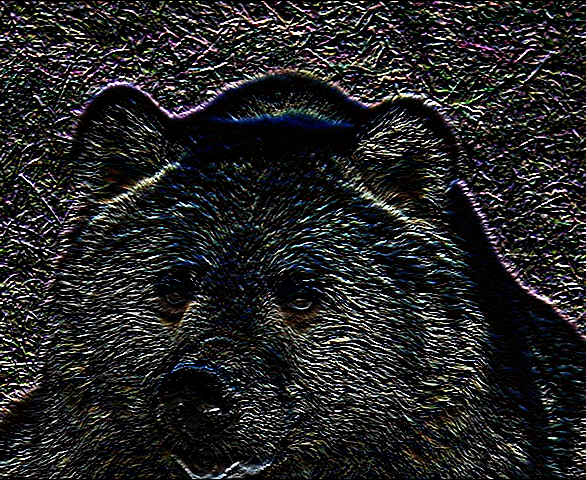

In [25]:
cv2_imshow(cv2.Sobel(src=img, ddepth=cv2.CV_64F, dx=0, dy=1))

### <a name='a6'></a> Generowanie losowego obrazu

In [26]:
# w skali szarości
array = np.random.randint(low=0, high=256, size=(400, 500))
array

array([[ 69,  13, 198, ..., 220,  31, 146],
       [ 40, 143, 228, ...,  65,  86, 120],
       [ 93, 237,  36, ..., 207,  92, 179],
       ...,
       [ 11,  71, 187, ...,  83, 155, 174],
       [207, 241, 115, ..., 111,  37, 146],
       [136, 219, 103, ..., 146,  20, 113]])

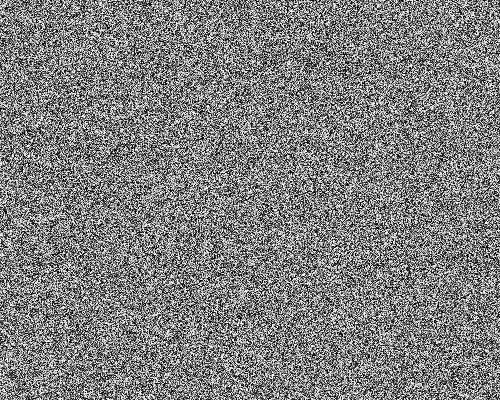

In [ ]:
cv2_imshow(array)

In [27]:
# kolorowy
array = np.random.randint(low=0, high=256, size=(400, 500, 3))
array

array([[[236, 227, 119],
        [103,  48, 242],
        [ 63, 186, 102],
        ...,
        [145, 113,  48],
        [236, 216, 173],
        [255, 219, 108]],

       [[209,  76,  64],
        [111, 229,   7],
        [  7, 192, 210],
        ...,
        [ 37, 208,  48],
        [ 98, 226, 207],
        [162, 190,   0]],

       [[146,  73, 198],
        [ 36, 119, 122],
        [ 79,  98,  77],
        ...,
        [ 36, 111, 201],
        [220,   3, 150],
        [179,  51,  75]],

       ...,

       [[171,  77, 254],
        [ 17, 124, 149],
        [101, 169, 145],
        ...,
        [157,  54, 248],
        [ 47,  53, 150],
        [ 76, 102,  92]],

       [[224, 203, 251],
        [145, 124, 134],
        [181,  19,   0],
        ...,
        [115,  62, 223],
        [107, 135, 156],
        [124,   9, 137]],

       [[110,  27, 124],
        [204,   6, 198],
        [142, 159, 195],
        ...,
        [153,  70, 252],
        [ 56, 166, 194],
        [232, 233,  65]]

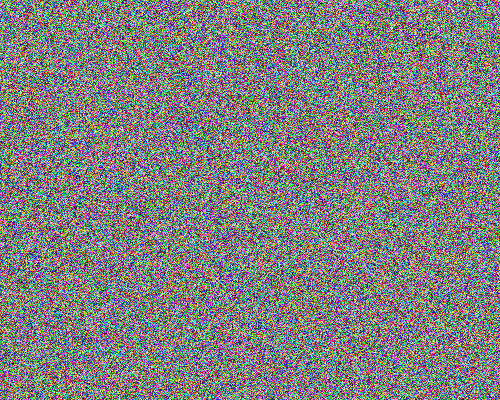

In [28]:
cv2_imshow(array)

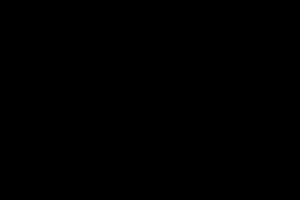

In [29]:
array = np.zeros(shape=(200, 300))
cv2_imshow(array)

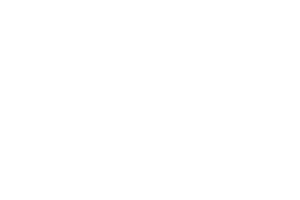

In [30]:
array = np.full(shape=(200, 300), fill_value=255)
cv2_imshow(array)

### <a name='a7'></a> Detekcja krawędzi

Filtr krawędzi pionowych

|    |   |   |
|----|---|---|
| -1 | 0 | 1 |
| -2 | 0 | 2 |
| -1 | 0 | 1 |

Filtr krawędzi poziomych

|    |    |    |
|----|----|----|
| -1 | -2 | -1 |
| 0  | 0  | 0  |
| 1  | 2  | 1  |

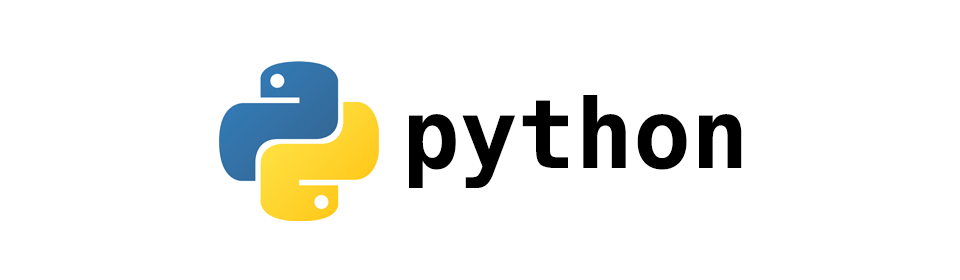

In [31]:
logo = cv2.imread('python.png')
cv2_imshow(logo)

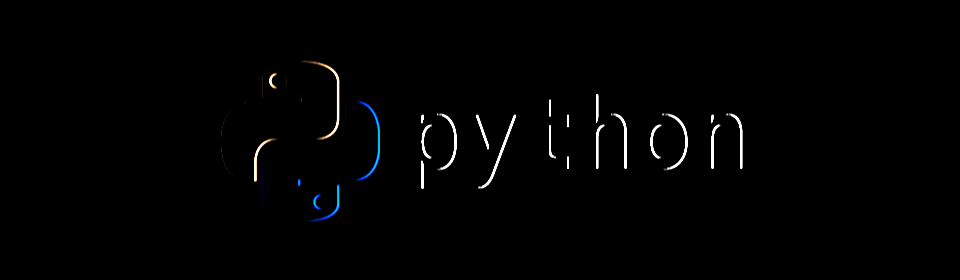

In [32]:
kernel_vertical = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
output = cv2.filter2D(src=logo, ddepth=-1, kernel=kernel_vertical)
cv2_imshow(output)

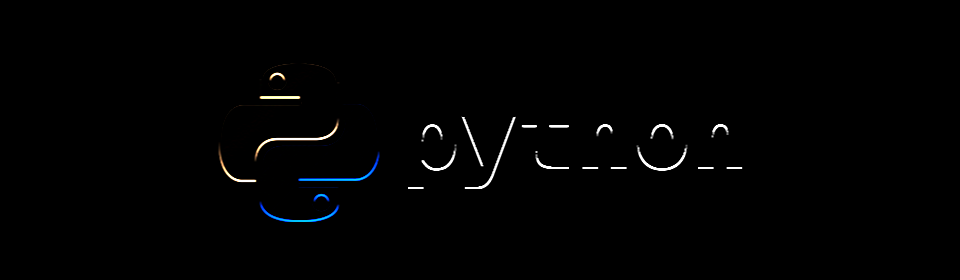

In [33]:
kernel_horizontal = np.array([[-1, -2, -1], [0 , 0, 0], [1, 2, 1]])
output = cv2.filter2D(src=logo, ddepth=-1, kernel=kernel_horizontal)
cv2_imshow(output)

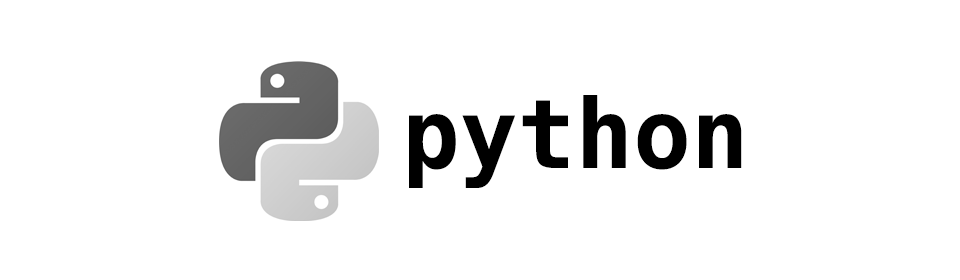

In [34]:
logo = cv2.imread('python.png', flags=cv2.IMREAD_GRAYSCALE)
cv2_imshow(logo)

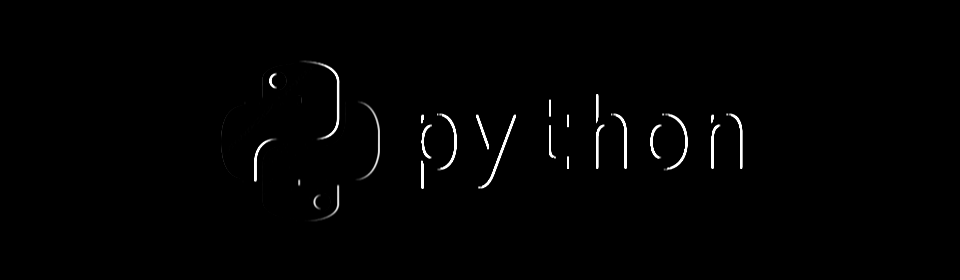

In [35]:
cv2_imshow(cv2.filter2D(src=logo, ddepth=-1, kernel=kernel_vertical))

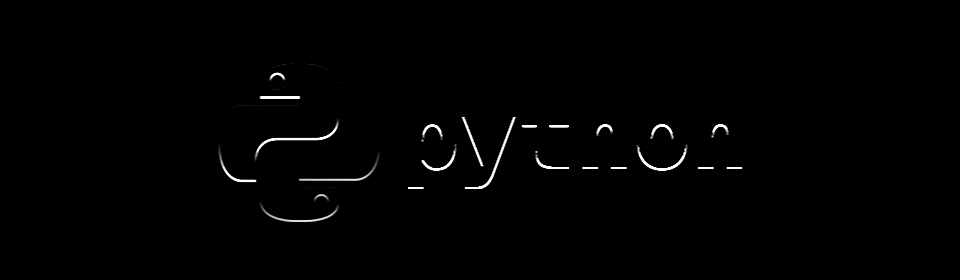

In [36]:
cv2_imshow(cv2.filter2D(src=logo, ddepth=-1, kernel=kernel_horizontal))

Filtry, którymi się posługujemy są znane pod nazwą Sobel. Bilioteka OpenCV dostarcza także gotową funkcję Sobel.

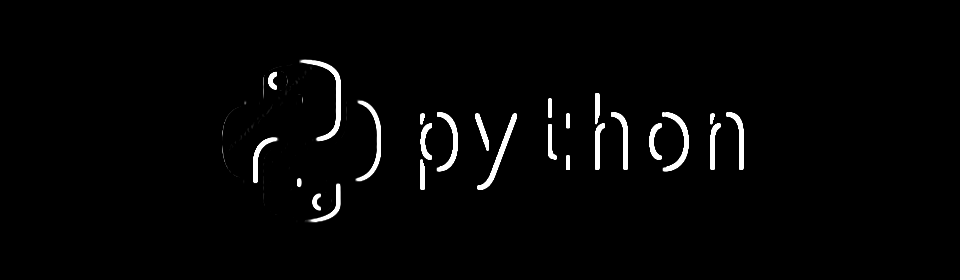

In [37]:
cv2_imshow(cv2.Sobel(src=logo, ddepth=cv2.CV_64F, dx=1, dy=0, ksize=5))

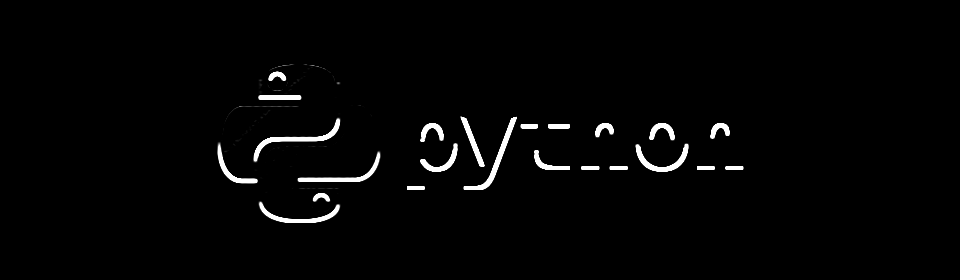

In [38]:
cv2_imshow(cv2.Sobel(src=logo, ddepth=cv2.CV_64F, dx=0, dy=1, ksize=5))

Innym znanym filterm, który pozwala wykrywać krawędzie jest Laplacian.

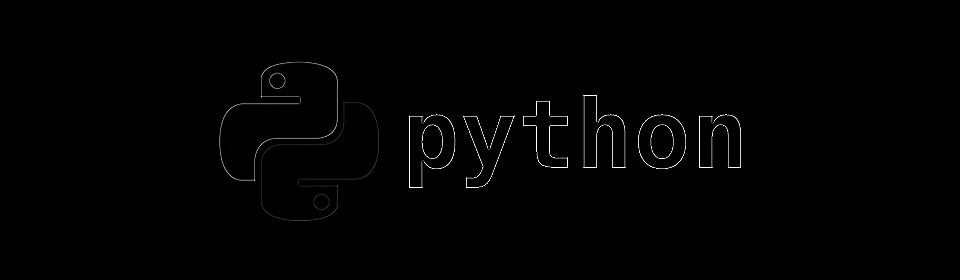

In [39]:
cv2_imshow(cv2.Laplacian(src=logo, ddepth=cv2.CV_64F))

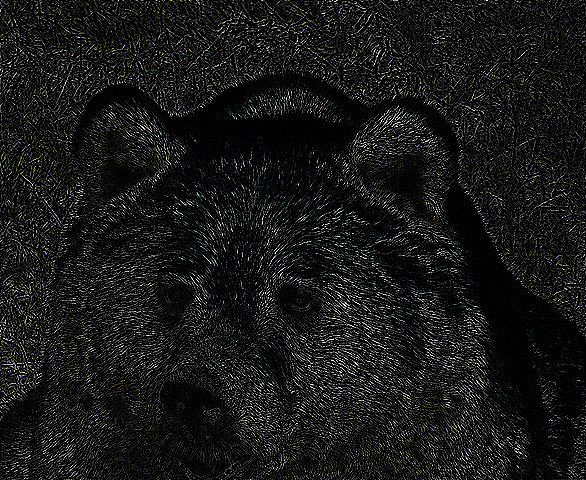

In [40]:
view = cv2.imread('bear.jpg')
cv2_imshow(cv2.Laplacian(src=view, ddepth=cv2.CV_64F))

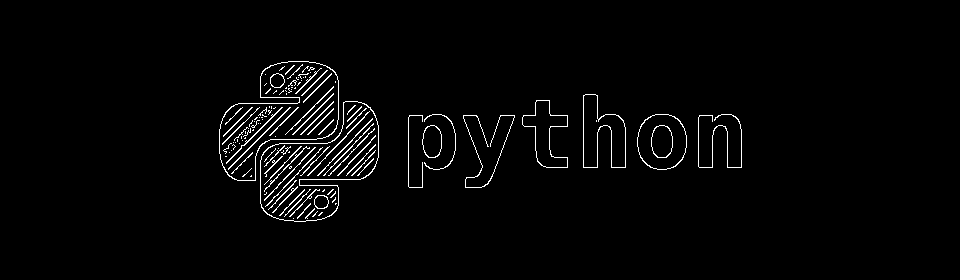

In [41]:
cv2_imshow(cv2.Canny(image=logo, threshold1=0, threshold2=0))

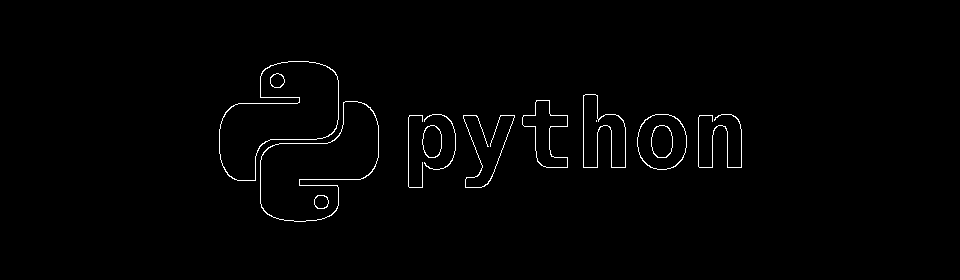

In [42]:
cv2_imshow(cv2.Canny(image=logo, threshold1=100, threshold2=100))

### <a name='a8'></a> Erozja

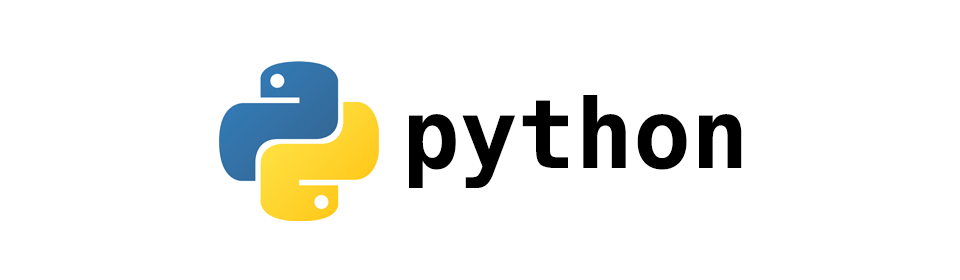

In [43]:
logo = cv2.imread('python.png')
cv2_imshow(logo)

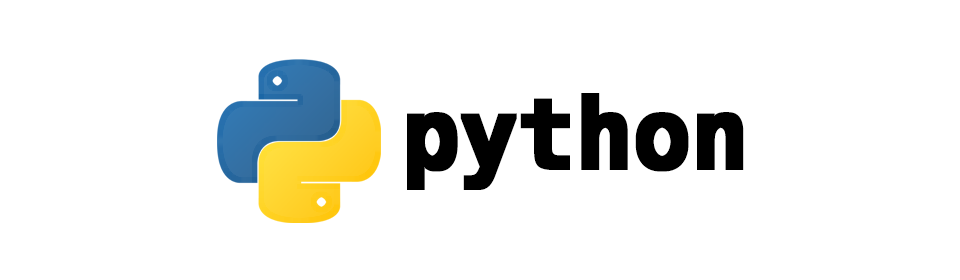

In [45]:
kernel = np.ones((5, 5), np.uint8)
cv2_imshow(cv2.erode(src=logo, kernel=kernel, iterations=1))

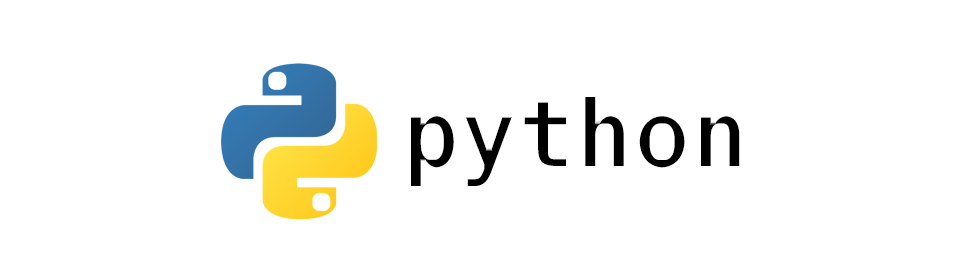

In [46]:
cv2_imshow(cv2.dilate(src=logo, kernel=kernel, iterations=1))